In [ ]:
!pip install vadersentiment

# Modules

In [ ]:
#run this line if you never download it before
import nltk
nltk.download("opinion_lexicon")

[nltk_data] Downloading package opinion_lexicon to /root/nltk_data...
[nltk_data]   Package opinion_lexicon is already up-to-date!


True

In [ ]:
import pandas as pd
from nltk.corpus import opinion_lexicon
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_recall_fscore_support
from sklearn.metrics import f1_score
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score
nltk.download('punkt')
import numpy as np
import statistics
import pandas as pd
import re
import os
#added these to lemmantize/stem if we want to do that (regan)
import nltk
from nltk.tokenize import word_tokenize
from nltk import PorterStemmer
from nltk import WordNetLemmatizer
from nltk.corpus import stopwords
import math
import gensim
from gensim import corpora,models
nltk.download('wordnet')
import seaborn as sns

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [ ]:
from google.colab import files
uploaded = files.upload()

Saving rotten_tomatoes_critic_reviews.csv to rotten_tomatoes_critic_reviews (5).csv


In [ ]:
moviereviews = pd.read_csv('rotten_tomatoes_critic_reviews.csv')
moviereviews.head()

,rotten_tomatoes_link,Title,content_rating,genres,tomatometer_status,tomatometer_rating,audience_status,audience_rating,top_critic,review_type,review_content
0,m/captain_marvel,Captain Marvel,PG-13,"Action & Adventure, Science Fiction & Fantasy",Certified-Fresh,79,Spilled,47,False,Rotten,"""A bit of a misstep at a very crucial time."""
1,m/crawl_2019,Crawl,R,Horror,Certified-Fresh,83,Upright,75,False,Fresh,"""A bit over the top with it's 'go get 'em cham..."
2,m/the_mustang,The Mustang,R,Drama,Certified-Fresh,95,Upright,74,False,Fresh,"""A compelling story from a director that is de..."
3,m/dumbo_2019,Dumbo,PG,"Animation, Kids & Family, Science Fiction & Fa...",Rotten,46,Spilled,48,False,Rotten,"""A Disney blockbuster ending with celebratory ..."
4,m/a_dogs_way_home,A Dog's Way Home,PG,Drama,Rotten,59,Upright,71,True,Fresh,"""A Dog's Way Home"" doesn't do anything new wit..."


# Preprocessing the data - tokenizing, stemming etc to analyze

In [ ]:
# remove non alphabets
remove_non_alphabets = lambda x: re.sub(r'[^a-zA-Z]',' ',x)

# tokenize alphabets-only list
tokenize = lambda x: word_tokenize(x)

# assign ps to a lambda function to run on each line of value
ps = PorterStemmer()
stem = lambda w: [ ps.stem(x) for x in w ]

# assign lemmatizer to a lambda function to run on each line of value
lemmatizer = WordNetLemmatizer()
leammtizer = lambda x: [ lemmatizer.lemmatize(word) for word in x ]

In [ ]:
moviereviews['review_content']=moviereviews['review_content'].apply(str)

In [ ]:
# lower case all strings
moviereviews['review_content'] = moviereviews['review_content'].str.lower()

In [ ]:
moviereviews['review_content']

0             "a bit of a misstep at a very crucial time."
1        "a bit over the top with it's 'go get 'em cham...
2        "a compelling story from a director that is de...
3        "a disney blockbuster ending with celebratory ...
4        "a dog's way home" doesn't do anything new wit...
                               ...                        
55714    zoabi relies on the old adage that we have mor...
55715    zombie has gifts; he really does. and i'd rath...
55716    zombies come into existence along the way duri...
55717    zombie's enthusiasm is waning, coming dangerou...
55718    zombies, workers vs wages, loves story all mak...
Name: review_content, Length: 55719, dtype: object

# Vader Sentiment Analysis

In [ ]:
analyzer = SentimentIntensityAnalyzer()
scores = [analyzer.polarity_scores(sentence) for sentence in moviereviews['review_content']]

In [ ]:
neg_s = [i["neg"] for i in scores]
neu_s = [i["neu"] for i in scores]
pos_s = [i["pos"] for i in scores]
compound_s = [i["compound"] for i in scores]

In [ ]:
moviereviews['negscore_Vader'], moviereviews['neuscore_Vader'], moviereviews['posscore_Vader'], moviereviews['compound_Vader'] = neg_s, neu_s, pos_s, compound_s

In [ ]:
moviereviews[['review_content','negscore_Vader','neuscore_Vader','posscore_Vader','compound_Vader']].head(5)

,review_content,negscore_Vader,neuscore_Vader,posscore_Vader,compound_Vader
0,"""a bit of a misstep at a very crucial time.""",0.000,1.000,0.000,0.0000
1,"""a bit over the top with it's 'go get 'em cham...",0.164,0.621,0.215,0.2372
2,"""a compelling story from a director that is de...",0.000,0.672,0.328,0.5983
3,"""a disney blockbuster ending with celebratory ...",0.000,0.919,0.081,0.5994
4,"""a dog's way home"" doesn't do anything new wit...",0.080,0.663,0.257,0.8153


In [ ]:
moviereviews[['rotten_tomatoes_link','Title','content_rating','genres','tomatometer_status','tomatometer_rating','audience_status', 'audience_rating', 'top_critic', 'review_type', 'review_content','compound_Vader']]

,rotten_tomatoes_link,Title,content_rating,genres,tomatometer_status,tomatometer_rating,audience_status,audience_rating,top_critic,review_type,review_content,compound_Vader
0,m/captain_marvel,Captain Marvel,PG-13,"Action & Adventure, Science Fiction & Fantasy",Certified-Fresh,79,Spilled,47,False,Rotten,"""a bit of a misstep at a very crucial time.""",0.0000
1,m/crawl_2019,Crawl,R,Horror,Certified-Fresh,83,Upright,75,False,Fresh,"""a bit over the top with it's 'go get 'em cham...",0.2372
2,m/the_mustang,The Mustang,R,Drama,Certified-Fresh,95,Upright,74,False,Fresh,"""a compelling story from a director that is de...",0.5983
3,m/dumbo_2019,Dumbo,PG,"Animation, Kids & Family, Science Fiction & Fa...",Rotten,46,Spilled,48,False,Rotten,"""a disney blockbuster ending with celebratory ...",0.5994
4,m/a_dogs_way_home,A Dog's Way Home,PG,Drama,Rotten,59,Upright,71,True,Fresh,"""a dog's way home"" doesn't do anything new wit...",0.8153
...,...,...,...,...,...,...,...,...,...,...,...,...
55714,m/tel_aviv_on_fire,Tel Aviv on Fire,NR,"Art House & International, Comedy, Drama",Certified-Fresh,90,Upright,86,True,Fresh,zoabi relies on the old adage that we have mor...,0.6925
55715,m/3_from_hell,3 from Hell,R,Horror,Rotten,56,Spilled,59,False,Rotten,zombie has gifts; he really does. and i'd rath...,0.3182
55716,m/little_monsters_2019,Little Monsters,NR,"Comedy, Horror",Certified-Fresh,80,Upright,100,False,Fresh,zombies come into existence along the way duri...,0.5927
55717,m/3_from_hell,3 from Hell,R,Horror,Rotten,56,Spilled,59,False,Rotten,"zombie's enthusiasm is waning, coming dangerou...",-0.0258


In [ ]:
moviereviews['review_type'] = moviereviews['review_type'].replace(['Fresh','Rotten',...],['1','0',...])
moviereviews1 = moviereviews.copy()

In [ ]:
moviereviews1["review_type"] = pd.to_numeric(moviereviews1["review_type"])

In [ ]:
moviereviews['pred_V'] = np.where(moviereviews['compound_Vader']<0,0,1)

In [ ]:
moviereviews[['review_content','negscore_Vader','neuscore_Vader','posscore_Vader','compound_Vader','pred_V']].head(5)

,review_content,negscore_Vader,neuscore_Vader,posscore_Vader,compound_Vader,pred_V
0,"""a bit of a misstep at a very crucial time.""",0.000,1.000,0.000,0.0000,1
1,"""a bit over the top with it's 'go get 'em cham...",0.164,0.621,0.215,0.2372,1
2,"""a compelling story from a director that is de...",0.000,0.672,0.328,0.5983,1
3,"""a disney blockbuster ending with celebratory ...",0.000,0.919,0.081,0.5994,1
4,"""a dog's way home"" doesn't do anything new wit...",0.080,0.663,0.257,0.8153,1


In [ ]:
print(classification_report(moviereviews1['review_type'], moviereviews['pred_V']))
print(confusion_matrix(moviereviews1['review_type'], moviereviews['pred_V']))

              precision    recall  f1-score   support

           0       0.47      0.43      0.45     16636
           1       0.77      0.79      0.78     39083

    accuracy                           0.68     55719
   macro avg       0.62      0.61      0.61     55719
weighted avg       0.68      0.68      0.68     55719

[[ 7179  9457]
 [ 8199 30884]]


# Bing Liu Sentiment **Analysis**

In [ ]:
data = moviereviews['review_content']

In [ ]:
def count_pos_neg(data, positive_dict, negative_dict):
# count of positive and negative words that appeared in each message
# net count which is calculated by positive count subtracting negative count. 
    poscnt = []
    negcnt = []
    netcnt = []

    for nrow in range(0,len(data)):
        text = data[nrow]
        
        qa = 0
        qb = 0

        for word in positive_dict :
            if (word in text) :
                qa = qa + 1

        for word in negative_dict :
            if (word in text) :
                qb = qb + 1

        qc = qa - qb

        poscnt.append(qa)
        negcnt.append(qb)
        netcnt.append(qc)

    return (poscnt, negcnt, netcnt)

In [ ]:
pos_list_BL=set(opinion_lexicon.positive())
neg_list_BL=set(opinion_lexicon.negative())

In [ ]:
moviereviews['poscnt_BL'], moviereviews['negcnt_BL'], moviereviews['netcnt_BL'] = count_pos_neg(data, pos_list_BL, neg_list_BL)

In [ ]:
moviereviews2 = moviereviews.copy()
#moviereviews2

In [ ]:
moviereviews2["review_type"] = pd.to_numeric(moviereviews["review_type"])

In [ ]:
moviereviews2['pred_BL'] = np.where(moviereviews2['netcnt_BL']<0,0,1)

In [ ]:
moviereviews2[['review_content','review_type','poscnt_BL','negcnt_BL','netcnt_BL','pred_BL']].head(5)

,review_content,review_type,poscnt_BL,negcnt_BL,netcnt_BL,pred_BL
0,"""a bit of a misstep at a very crucial time.""",0,0,1,-1,0
1,"""a bit over the top with it's 'go get 'em cham...",1,3,4,-1,0
2,"""a compelling story from a director that is de...",1,0,2,-2,0
3,"""a disney blockbuster ending with celebratory ...",0,4,5,-1,0
4,"""a dog's way home"" doesn't do anything new wit...",1,4,4,0,1


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(moviereviews2['review_type'], moviereviews['pred_BL']))
print(confusion_matrix(moviereviews2['review_type'], moviereviews['pred_BL']))

              precision    recall  f1-score   support

           0       0.39      0.64      0.48     16636
           1       0.79      0.56      0.66     39083

    accuracy                           0.59     55719
   macro avg       0.59      0.60      0.57     55719
weighted avg       0.67      0.59      0.60     55719

[[10679  5957]
 [17041 22042]]


# Data Exploration

In [ ]:
n_variables = moviereviews[['tomatometer_rating','audience_rating','compound_Vader']]

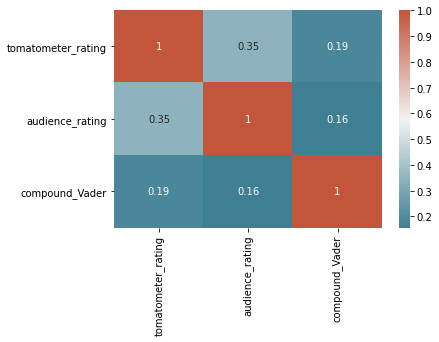

In [ ]:
# calculate correlation matrix

corr = n_variables.corr()# plot the heatmap
sns.heatmap(corr, xticklabels=corr.columns, yticklabels=corr.columns, annot=True, cmap=sns.diverging_palette(220, 20, as_cmap=True))

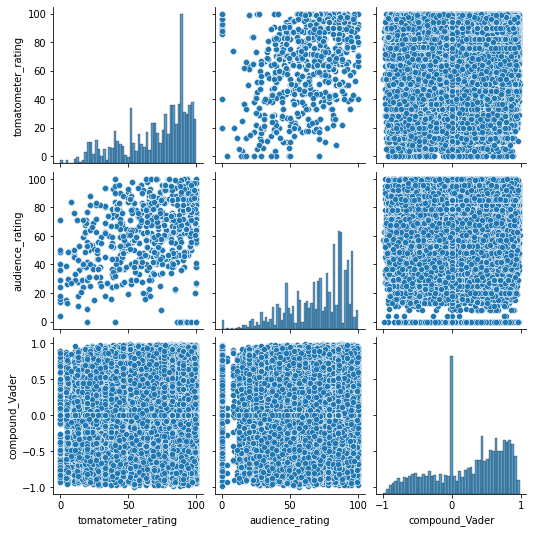

In [ ]:
sns.pairplot(n_variables)

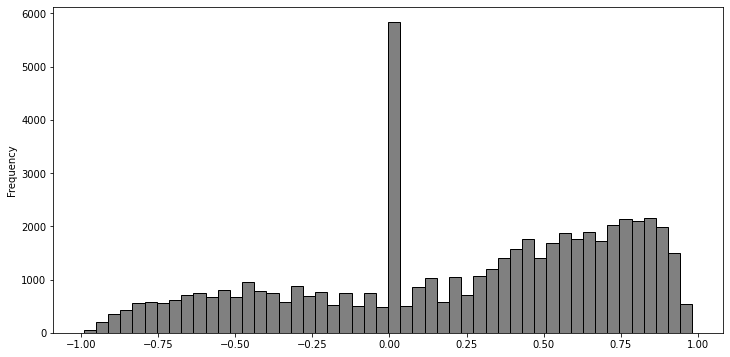

In [ ]:
moviereviews['compound_Vader'].plot(kind='hist', bins=50, figsize=(12,6), facecolor='grey',edgecolor='black')

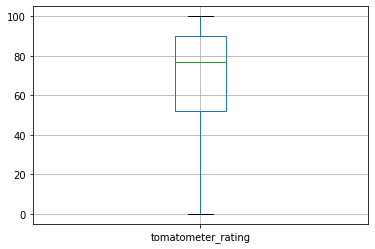

In [ ]:
moviereviews.boxplot('tomatometer_rating')

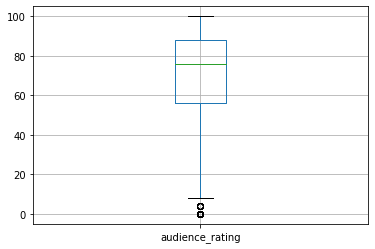

In [ ]:
moviereviews.boxplot('audience_rating')

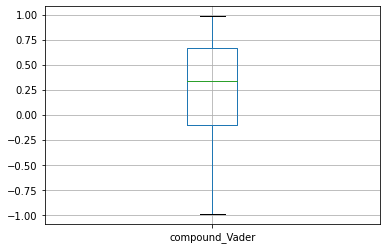

In [ ]:
moviereviews.boxplot('compound_Vader')

## Topic Modeling

In [ ]:
import pandas as pd 
import gensim
from gensim import corpora,models
import nltk
nltk.download('stopwords')
from nltk.tokenize import RegexpTokenizer
from nltk.corpus import stopwords

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [ ]:
reviewcontent = moviereviews['review_content']=moviereviews['review_content'].apply(str)
reviewcontent

0             "A bit of a misstep at a very crucial time."
1        "A bit over the top with it's 'go get 'em cham...
2        "A compelling story from a director that is de...
3        "A Disney blockbuster ending with celebratory ...
4        "A Dog's Way Home" doesn't do anything new wit...
                               ...                        
55714    Zoabi relies on the old adage that we have mor...
55715    Zombie has gifts; he really does. And I'd rath...
55716    Zombies come into existence along the way duri...
55717    Zombie's enthusiasm is waning, coming dangerou...
55718    Zombies, Workers vs wages, loves story all mak...
Name: review_content, Length: 55719, dtype: object

In [ ]:
# reduce dataset so code runs faster
#reviewcontent = reviewcontent[:25000]

In [ ]:
# Tokenize the documents.
#import nltk
#nltk.download('stopwords')
#from nltk.tokenize import RegexpTokenizer
#from nltk.corpus import stopwords

# Split the documents into tokens.
tokenizer = RegexpTokenizer(r'\w+')
for idx in range(len(reviewcontent)):
    reviewcontent[idx] = reviewcontent[idx].lower()  # Convert to lowercase.
    reviewcontent[idx] = tokenizer.tokenize(reviewcontent[idx])  # Split into words.

# Remove numbers, but not words that contain numbers.
reviewcontent = [[token for token in doc if not token.isnumeric()] for doc in reviewcontent]
    
# Remove stopwords.
reviewcontent = [[token for token in doc if token not in stopwords.words('english')] for doc in reviewcontent]

# Remove words that are only one character.
reviewcontent = [[token for token in doc if len(token) > 1] for doc in reviewcontent]

In [ ]:
# Lemmatize the documents.
from nltk.stem.wordnet import WordNetLemmatizer

lemmatizer = WordNetLemmatizer()
reviewcontent = [[lemmatizer.lemmatize(token) for token in doc] for doc in reviewcontent]

In [ ]:
# Compute bigrams.
from gensim.models import Phrases

# Add bigrams and trigrams to docs (only ones that appear 20 times or more).
bigram = Phrases(reviewcontent, min_count=10)
for idx in range(len(reviewcontent)):
    for token in bigram[reviewcontent[idx]]:
        if '_' in token:
            # Token is a bigram, add to document.
            reviewcontent[idx].append(token)

/usr/local/lib/python3.7/dist-packages/gensim/models/phrases.py:598: UserWarning: For a faster implementation, use the gensim.models.phrases.Phraser class
  warnings.warn("For a faster implementation, use the gensim.models.phrases.Phraser class")


In [ ]:
reviewcontent[0] # to show the bigrams - ex "bad_guy" at bottom of list

['bit', 'misstep', 'crucial', 'time']

In [ ]:
# Remove rare and common tokens.
from gensim.corpora import Dictionary

# Create a dictionary representation of the documents.
dictionary
dictionary = Dictionary(reviewcontent)

# Filter out words that occur less than 10 documents, or more than 70% of the documents.
# This step would be necessary in larger text
dictionary.filter_extremes(no_below=10, no_above=0.7) #maybe comment out

In [ ]:
reviewcontent[0]

['bit', 'misstep', 'crucial', 'time']

### Generate Term Document Matrix

In [ ]:
# Bag-of-words representation of the documents.
corpus = [dictionary.doc2bow(doc) for doc in reviewcontent]

print('Number of unique tokens: %d' % len(dictionary)) 
print('Number of documents: %d' % len(corpus))

Number of unique tokens: 9541
Number of documents: 55719


In [ ]:
# generate a unique token list 
sort_token = sorted(dictionary.items(),key=lambda k:k[0], reverse = False)
unique_token = [token.encode('utf8') for (ID,token) in sort_token]

In [ ]:

import numpy as np
matrix = gensim.matutils.corpus2dense(corpus,num_terms=len(dictionary),dtype = 'int')
matrix = matrix.T #transpose the matrix 
#convert the numpy matrix into pandas data frame
matrix_df = pd.DataFrame(matrix, columns=unique_token)

/usr/local/lib/python3.7/dist-packages/gensim/matutils.py:502: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
  result = np.column_stack(sparse2full(doc, num_terms) for doc in corpus)


In [ ]:
#write matrix dataframe into csv
matrix_df.to_csv('Movie_Reviews_Term_Document_matrix.csv')

### LDA model 

In [ ]:
# Train LDA model.
from gensim.models import LdaModel

# Set training parameters.
num_topics = 10
chunksize = 2000
passes = 20
iterations = 100
eval_every = 1  # Don't evaluate model perplexity, takes too much time.

# Make a index to word dictionary.
temp = dictionary[0]  # This is only to "load" the dictionary.
id2word = dictionary.id2token

# if we're interested in the different clusters of topics being mentioned throughout these docs, then choose a small number for num_topics 
# if we have a small corpus but want to generate 100 topics, then some will overlap 

In [ ]:
lda = LdaModel(
    corpus=corpus,
    id2word=id2word,
    chunksize=chunksize,
    alpha='auto',
    eta='auto',
    iterations=iterations,
    num_topics=num_topics,
    passes=passes,
    eval_every=eval_every
)

In [ ]:
lda = LdaModel(
    corpus=corpus,
    id2word=id2word,
    chunksize=chunksize,
    alpha='auto',
    eta='auto',
    iterations=iterations,
    num_topics=num_topics,
    passes=passes,
    eval_every=eval_every
)

lda.print_topics(10) #V matrix, topic matrix
import re
for i,topic in lda.print_topics(10):
    print(f'Top 10 words for topic #{i+1}:')
    print(",".join(re.findall('".*?"',topic)))
    print('\n')

Top 10 words for topic #1:
"life","love","woman","experience","power","human","cinematic","documentary","art","final"


Top 10 words for topic #2:
"star","war","result","rise","eye","skywalker","matter","issue","care","rise_skywalker"


Top 10 words for topic #3:
"sequence","talent","flat","terrific","de","cat","sharp","talented","surface","satire"


Top 10 words for topic #4:
"film","movie","story","one","like","make","character","time","feel","much"


Top 10 words for topic #5:
"king","music","material","light","remake","miss","live","space","nature","lion"


Top 10 words for topic #6:
"director","drama","writer","sense","tale","writer_director","feature","self","strong","start"


Top 10 words for topic #7:
"marvel","universe","production","got","fast","add","spy","house","design","captain"


Top 10 words for topic #8:
"man","far","high","home","age","coming","zellweger","boy","spider","smith"


Top 10 words for topic #9:
"full","review","full_review","spanish","comic","book","third"

#### prints topics and weight of each words  

In [ ]:
top_topics = lda.top_topics(corpus) #, num_words=20)

# Average topic coherence is the sum of topic coherences of all topics, divided by the number of topics.
avg_topic_coherence = sum([t[1] for t in top_topics]) / num_topics
print('Average topic coherence: %.4f.' % avg_topic_coherence)

from pprint import pprint
pprint(top_topics)

Average topic coherence: -8.7887.
[([(0.034930438, 'film'),
   (0.023844952, 'movie'),
   (0.014066586, 'story'),
   (0.01362013, 'one'),
   (0.011755431, 'like'),
   (0.010557337, 'make'),
   (0.009140752, 'character'),
   (0.008954718, 'time'),
   (0.008680445, 'feel'),
   (0.0074606175, 'much'),
   (0.007408947, 'good'),
   (0.0066006733, 'way'),
   (0.0062837657, 'well'),
   (0.0059145214, 'even'),
   (0.005830146, 'work'),
   (0.0058147665, 'fun'),
   (0.0057075517, 'best'),
   (0.0056967214, 'get'),
   (0.00537443, 'enough'),
   (0.0051582097, 'never')],
  -3.096243316622566),
 ([(0.03212522, 'director'),
   (0.020580288, 'drama'),
   (0.014859419, 'writer'),
   (0.014508937, 'sense'),
   (0.014224283, 'tale'),
   (0.011537281, 'writer_director'),
   (0.011415138, 'feature'),
   (0.009889784, 'self'),
   (0.009622954, 'strong'),
   (0.008026903, 'start'),
   (0.0076405946, 'style'),
   (0.0072619715, 'becomes'),
   (0.006723628, 'american'),
   (0.006663826, 'theme'),
   (0.00608

In [ ]:
# Generate U Matrix for LDA model
corpus_lda = lda[corpus] #transform lda model

#convert corpus_lda to numpy matrix
U_matrix_lda = gensim.matutils.corpus2dense(corpus_lda,num_terms=10).T

#write U_matrix into pandas dataframe and output
U_matrix_lda_df = pd.DataFrame(U_matrix_lda)
U_matrix_lda_df.to_csv('U_matrix_lda.csv')

/usr/local/lib/python3.7/dist-packages/gensim/matutils.py:502: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
  result = np.column_stack(sparse2full(doc, num_terms) for doc in corpus)


In [ ]:
print(matrix_df.shape)
print(U_matrix_lda_df.shape)

(55719, 9541)
(55719, 10)


#### Improving the Topic Coherence Score - future research

In [ ]:
moviereviews.to_csv('results.csv')

',rotten_tomatoes_link,Title,content_rating,genres,tomatometer_status,tomatometer_rating,audience_status,audience_rating,top_critic,review_type,review_content,negscore_Vader,neuscore_Vader,posscore_Vader,compound_Vader\n0,m/primal,Primal,R,Action & Adventure,Rotten,38,Spilled,24,False,Fresh,Imagine a much more savage version of Noah s Ark  with Nicolas Cage yelling some truly great lines about his cat while fighting bad guy Kevin Durand  and you have the new movie Primal ,0.21,0.632,0.158,-0.3167\n1,m/primal,Primal,R,Action & Adventure,Rotten,38,Spilled,24,True,Rotten,There is a limit to the redemption Nicolas Cage can grant a terrible movie  and  Primal  is it ,0.144,0.741,0.116,-0.1531\n2,m/primal,Primal,R,Action & Adventure,Rotten,38,Spilled,24,False,Fresh,With a possessive big game hunter and a rare cat  combined with a smart  psychopathic killer on the loose aboard a ship at sea  you can kind of figure out where this adventure yarn is going ,0.189,0.668,0.143,-0.4723\n3,m/primal,P

# Classification

In [ ]:
import matplotlib.pyplot as plt
import re
import os
import pandas as pd
import numpy as np

import nltk
from nltk.tokenize import word_tokenize
from nltk import PorterStemmer
from nltk import WordNetLemmatizer
from nltk.corpus import stopwords

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn import metrics

import gensim

In [ ]:
df = pd.read_csv("rotten_tomatoes_critic_reviews.csv", usecols=["review_content", "review_type"])

In [ ]:
df['review_type'] = df['review_type'].replace(['Fresh','Rotten',...],['1','0',...])
df

,review_type,review_content
0,0,"""A bit of a misstep at a very crucial time."""
1,1,"""A bit over the top with it's 'go get 'em cham..."
2,1,"""A compelling story from a director that is de..."
3,0,"""A Disney blockbuster ending with celebratory ..."
4,1,"""A Dog's Way Home"" doesn't do anything new wit..."
...,...,...
55714,1,Zoabi relies on the old adage that we have mor...
55715,0,Zombie has gifts; he really does. And I'd rath...
55716,1,Zombies come into existence along the way duri...
55717,0,"Zombie's enthusiasm is waning, coming dangerou..."


In [ ]:
df1 = df.copy()

In [ ]:
df1["review_type"] = pd.to_numeric(df1["review_type"])

In [ ]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 55719 entries, 0 to 55718
Data columns (total 2 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   review_type     55719 non-null  int64 
 1   review_content  55719 non-null  object
dtypes: int64(1), object(1)
memory usage: 870.7+ KB


In [ ]:
# Data Pre-processing cont: Tokenizing, Stemming, Lemmentizing 
print('Processing : [=', end='')
df1['review_content'] = df1['review_content'].apply(remove_non_alphabets)
print('=', end='')
df1['review_content'] = df1['review_content'].apply(tokenize)
print('=', end='')
df1['review_content'] = df1['review_content'].apply(stem)
print('=', end='')
df1['review_content'] = df1['review_content'].apply(leammtizer)
print('=', end='')
df1['review_content'] = df1['review_content'].apply(lambda x: ' '.join(x))
print('] : Completed', end='')
df1.head()

Processing : [=====] : Completed

,review_type,review_content
0,0,A bit of a misstep at a veri crucial time
1,1,A bit over the top with it s go get em champ m...
2,1,A compel stori from a director that is definit...
3,0,A disney blockbust end with celebratori shot o...
4,1,A dog s way home doesn t do anyth new with the...


Split Train Test Sets

In [ ]:
# split to 30 percent test data and 70 percent train data
# labels can be seen as y, an dependent variable
train_corpus, test_corpus, train_labels, test_labels = train_test_split(df1["review_content"],
                                                                        df1["review_type"],
                                                                        test_size=0.3)

Bag of words

In [ ]:
# build frequency features' vectorizer and get features
freq_vectorizer=CountVectorizer(min_df=1, ngram_range=(1,1))
freq_train_features = freq_vectorizer.fit_transform(train_corpus)
freq_test_features = freq_vectorizer.transform(test_corpus)

TFIDF

In [ ]:
# build tfidf features' vectorizer and get features
tfidf_vectorizer=TfidfVectorizer(min_df=1, 
                                 norm='l2',
                                 smooth_idf=True,
                                 use_idf=True,
                                 ngram_range=(1,1))
tfidf_train_features = tfidf_vectorizer.fit_transform(train_corpus)  
tfidf_test_features = tfidf_vectorizer.transform(test_corpus)    

Define Evaluation Function

In [ ]:
# define a function to evaluate our classification models based on four metrics
# This defined function is also useful in other cases. This is comparing test_y and pred_y. 
# Both contain 1s and 0s.
def get_metrics(true_labels, predicted_labels):
    metrics_dict = dict(zip(["accuracy", "precision", "recall", "f1"], [None]*4))
    #metrics_dict = {i:None for i in ["accuracy", "precision", "recall", "f1"]}
    for m in metrics_dict.keys():
        exec('''metrics_dict['{}'] = np.round(                                                    
                        metrics.{}_score(true_labels, 
                                               predicted_labels),
                        2)'''.format(m, m))
    return metrics_dict

In [ ]:
# define a function that trains the model, performs predictions and evaluates the predictions
def train_predict_evaluate_model(classifier, 
                                 train_features, train_labels, 
                                 test_features, test_labels):
    # build model    
    classifier.fit(train_features, train_labels)
    # predict using model
    predictions = classifier.predict(test_features) 
    # evaluate model prediction performance   
    '''get_metrics(true_labels=test_labels, 
                predicted_labels=predictions)'''
    print(metrics.classification_report(test_labels,predictions))
    print(confusion_matrix(test_labels,predictions))
    return predictions, get_metrics(true_labels=test_labels, predicted_labels=predictions)   

In [ ]:
from sklearn.naive_bayes import MultinomialNB # import naive bayes
from sklearn.tree import DecisionTreeClassifier # import Decision Tree
from sklearn.ensemble import RandomForestClassifier # import random forest
from sklearn.metrics import confusion_matrix

Train and Test on Bag-of-Words Features

In [ ]:
# assign naive bayes function to an object
mnb = MultinomialNB()

# predict and evaluate naive bayes
mnb_freq_predictions, mnb_freq_metrics = train_predict_evaluate_model(classifier=mnb,
                                                                      
                                           train_features=freq_train_features,
                                           train_labels=train_labels,
                                                                      
                                           test_features=freq_test_features,
                                           test_labels=test_labels)

              precision    recall  f1-score   support

           0       0.70      0.67      0.69      4862
           1       0.87      0.88      0.88     11854

    accuracy                           0.82     16716
   macro avg       0.79      0.78      0.78     16716
weighted avg       0.82      0.82      0.82     16716

[[ 3252  1610]
 [ 1371 10483]]


In [ ]:
# assign decision tree function to an object
dt = DecisionTreeClassifier()

# predict and evaluate decision tree
dt_freq_predictions, dt_freq_metrics = train_predict_evaluate_model(classifier=dt,
                                                               train_features=freq_train_features,
                                                               train_labels=train_labels,
                                                               test_features=freq_test_features,
                                                               test_labels=test_labels)

              precision    recall  f1-score   support

           0       0.58      0.53      0.55      4862
           1       0.81      0.84      0.83     11854

    accuracy                           0.75     16716
   macro avg       0.70      0.69      0.69     16716
weighted avg       0.75      0.75      0.75     16716

[[2578 2284]
 [1857 9997]]


In [ ]:
# assign random forest function to an object
rf = RandomForestClassifier(criterion="entropy")

# predict and evaluate random forest
rf_freq_predictions, rf_freq_metrics = train_predict_evaluate_model(classifier=rf,
                                           train_features=freq_train_features,
                                           train_labels=train_labels,
                                           test_features=freq_test_features,
                                           test_labels=test_labels)

              precision    recall  f1-score   support

           0       0.87      0.39      0.54      4862
           1       0.80      0.98      0.88     11854

    accuracy                           0.81     16716
   macro avg       0.83      0.68      0.71     16716
weighted avg       0.82      0.81      0.78     16716

[[ 1905  2957]
 [  281 11573]]


Train and Test on TFIDF Features

In [ ]:
# predict and evaluate naive bayes
mnb_tfidf_predictions, mnb_tfidf_metrics = train_predict_evaluate_model(classifier=mnb,
                                           train_features=tfidf_train_features,
                                           train_labels=train_labels,
                                           test_features=tfidf_test_features,
                                           test_labels=test_labels)

              precision    recall  f1-score   support

           0       0.32      0.00      0.00      4862
           1       0.71      1.00      0.83     11854

    accuracy                           0.71     16716
   macro avg       0.52      0.50      0.42     16716
weighted avg       0.60      0.71      0.59     16716

[[   10  4852]
 [   21 11833]]


In [ ]:
# predict and evaluate decision tree
dt_tfidf_predictions, dt_tfidf_metrics = train_predict_evaluate_model(classifier=dt,
                                           train_features=tfidf_train_features,
                                           train_labels=train_labels,
                                           test_features=tfidf_test_features,
                                           test_labels=test_labels)

              precision    recall  f1-score   support

           0       0.29      0.29      0.29      4862
           1       0.71      0.72      0.71     11854

    accuracy                           0.59     16716
   macro avg       0.50      0.50      0.50     16716
weighted avg       0.59      0.59      0.59     16716

[[1399 3463]
 [3370 8484]]


In [ ]:
# predict and evaluate random forest
rf_tfidf_predictions, rf_tfidf_metrics = train_predict_evaluate_model(classifier=rf,
                                           train_features=tfidf_train_features,
                                           train_labels=train_labels,
                                           test_features=tfidf_test_features,
                                           test_labels=test_labels)

              precision    recall  f1-score   support

           0       0.29      0.05      0.08      4862
           1       0.71      0.95      0.81     11854

    accuracy                           0.69     16716
   macro avg       0.50      0.50      0.45     16716
weighted avg       0.59      0.69      0.60     16716

[[  224  4638]
 [  543 11311]]


Visualization Matrix

In [ ]:
# create a dictionary that stores all the accuracy information
performance_dict = {}

for me in ["accuracy", "precision", "recall", "f1"]:
    performance_dict[me] = {}
    for m in ["mnb","dt","rf"]:
        performance_dict[me][m] = {}
        for f in ["freq","tfidf"]:
            exec('performance_dict["{}"]["{}"]["{}"] = {}_{}_metrics["{}"]'.format(me, m, f, m, f, me))
        
#Accuracy Matrixt
print("\n\033[1;31mAccuracy Metrix\n\033[0m")
print(pd.DataFrame(performance_dict["accuracy"]).rename(columns={"mnb":"Naive Bayes", 
                                            "dt":"Decision Tree", 
                                            "rf":"Random Forest"}, 
                                   index={"freq":"Bag of Words", 
                                          "tfidf":"TFIDF"}))

#Precision Matrix
print("\n\033[1;31mPrecision Metrix\n\033[0m")
print(pd.DataFrame(performance_dict["precision"]).rename(columns={"mnb":"Naive Bayes", 
                                            "dt":"Decision Tree", 
                                            "rf":"Random Forest"}, 
                                   index={"freq":"Bag of Words", 
                                          "tfidf":"TFIDF"}))

#Recall Matrix
print("\n\033[1;31mRecall Metrix\n\033[0m")
print(pd.DataFrame(performance_dict["recall"]).rename(columns={"mnb":"Naive Bayes", 
                                            "dt":"Decision Tree", 
                                            "rf":"Random Forest"}, 
                                   index={"freq":"Bag of Words", 
                                          "tfidf":"TFIDF"}))

#F1 Score Matrix
print("\n\033[1;31mF1 Score Metrix\n\033[0m")
print(pd.DataFrame(performance_dict["f1"]).rename(columns={"mnb":"Naive Bayes", 
                                            "dt":"Decision Tree", 
                                            "rf":"Random Forest"}, 
                                   index={"freq":"Bag of Words", 
                                          "tfidf":"TFIDF"}))


Accuracy Metrix

           Naive Bayes  Decision Tree  Random Forest
Frequency         0.82           0.75           0.81
TFIDF             0.71           0.59           0.69

Precision Metrix

           Naive Bayes  Decision Tree  Random Forest
Frequency         0.87           0.81           0.80
TFIDF             0.71           0.71           0.71

Recall Metrix

           Naive Bayes  Decision Tree  Random Forest
Frequency         0.88           0.84           0.98
TFIDF             1.00           0.72           0.95

F1 Score Metrix

           Naive Bayes  Decision Tree  Random Forest
Frequency         0.88           0.83           0.88
TFIDF             0.83           0.71           0.81
